# Trabalho 2 — INF-0618 Deep Learning   
Alunos:
- Carlos Zerwes Amado Sette
- Igor Alejandro Sousa Santos
- João Pedro Brandimarte Viccari



Neste trabalho, vamos utilizar o conjunto de dados "Moral Stories", que consiste em narrativas estruturadas descrevendo possíveis ações tomadas por indivíduos em determinadas situações. O conjunto possui situações, normas morais, ações morais e imorais a serem tomadas e suas devidas consequencias. Nesta tarefa, utilizaremos um recorte do conjunto de dados, onde utilizaremos uma norma moral e uma ação, e o modelo deverá classificar se a ação tomada foi em acordo com a regra moral ou não.

O conjunto de dados possui 20000 amostras de treino, 2000 amostras de validação e 2000 amostras de teste. Tal divisão foi feita de diferentes formas, porém utilizaremos a divisão baseada em *lexical_bias* (viés léxico). Esta divisão foi construída identificando os *lemmas* que mais ocorrem em cada ação (divergente ou não da norma), e os conjuntos de teste e validação possuem os lemmas menos tendenciosos. Isso significa que existem palavras no conjunto de treino que podem acabar apontando para a classe 0 (divergente da norma) ou 1 (concorda com a norma), porém que não aparecerão em validação e teste.

Mais informações podem ser encontradas no seguinte [link](https://huggingface.co/datasets/demelin/moral_stories).


## Instalação das Bibliotecas

Para instalar as bibliotecas necessárias, execute os comandos abaixo:

In [1]:
# # Já instalados no colab, i|nstalar localmente!
# !pip install pandas
# !pip install transformers

# # Não instalado no Colab
# !pip install bertviz
# !pip install -U datasets # É preciso dar upgrade na biblioteca datasets do hugging face
# !pip install tf-keras

## Carregar e preparar os dados

O conjunto de dados vem pré dividido (como explicado na introdução do trabalho), é necessário apenas baixa-lo do site hugging face. Os campos disponíveis nesta versão do conjunto de dados são:

- **label**: 0 para ações divergentes da norma, e 1 para ações que concordam com a norma;
- **norm**: Norma para conduta social observada pela maioria das pessoas em situações do dia a dia;
- **moral_action**: Ação "moral" (normativa, que segue as regras morais) que leva à conclusão da intenção. Quando *label* é 1, este campo é '*not specified*';
- **imoral_action**: Ação imoral, que diverge da norma, porém leva à conclusão da intenção. Quando *label* é 0, este campo é '*not specified*';

Outros campos que não serão utilizados:
- **situation**: Cenário da história, descrevendo ambiente e personagens;
- **intention**: Objetivo que o ator quer atingir;
- **moral_consequence** e **immoral_consequence**: Possível efeito da ação normativa ou divergente do ator;
- **ID**: Identificador de cada amostra.

In [1]:
from datasets import load_dataset

dataset = load_dataset("demelin/moral_stories", "cls-action+norm-lexical_bias")
dataset

C:\Users\czset\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


DatasetDict({
    train: Dataset({
        features: ['ID', 'norm', 'situation', 'intention', 'moral_action', 'moral_consequence', 'immoral_action', 'immoral_consequence', 'label'],
        num_rows: 20000
    })
    validation: Dataset({
        features: ['ID', 'norm', 'situation', 'intention', 'moral_action', 'moral_consequence', 'immoral_action', 'immoral_consequence', 'label'],
        num_rows: 2000
    })
    test: Dataset({
        features: ['ID', 'norm', 'situation', 'intention', 'moral_action', 'moral_consequence', 'immoral_action', 'immoral_consequence', 'label'],
        num_rows: 2000
    })
})

## Exibir uma amostra por classe

Este código pega uma amostra por rótulo disponível e printa o resultado


In [2]:
import random
from datasets import Dataset

unique_labels = list(set(dataset['train']['label']))

# Coleta uma amostra por rótulo
samples = []
for label in unique_labels:
    label_data = dataset['train'].filter(lambda example: example['label'] == label)
    # Pega amostra aleatória
    random_sample = label_data[random.randint(0, len(label_data) - 1)]
    samples.append(random_sample)

# Mostra as amostras
samples

[{'ID': '3TE3O8573164ZTO8IX4HABY5UF92RB0',
  'norm': "It's rude to ignore your spouse.",
  'situation': 'not specified',
  'intention': 'not specified',
  'moral_action': 'not specified',
  'moral_consequence': 'not specified',
  'immoral_action': "Ted pretends he doesn't hear his wife as she keeps on talking, and he goes to bed.",
  'immoral_consequence': 'not specified',
  'label': 0},
 {'ID': '36V4Q8R5ZLYUUWD1F0Y1KU2Y5LFQMR1',
  'norm': "It's rude to pay too much attention to people's body.",
  'situation': 'not specified',
  'intention': 'not specified',
  'moral_action': 'Jessica points out dresses for Kelly to try without mentioning her body.',
  'moral_consequence': 'not specified',
  'immoral_action': 'not specified',
  'immoral_consequence': 'not specified',
  'label': 1}]

## Exemplo: Carregar modelo e tokenizer BERT para classificação

Neste exemplo, utilizamos a biblioteca `transformers` para carregar um modelo BERT pré-treinado e o tokenizer correspondente, configurado para uma tarefa de classificação binária. O número de classes é definido como 2 (ação normativa ou divergente).

Você pode ajustar o modelo de acordo com sua capacidade computacional. Aqui estão as opções de modelos disponíveis:
- **"prajjwal1/bert-tiny"**: Modelo mais leve, ideal para recursos limitados.
- **"prajjwal1/bert-small"**: Um pouco maior, ainda eficiente para muitos cenários.
- **"prajjwal1/bert-base"**: Tamanho padrão do BERT.
- **"prajjwal1/bert-medium"**: Modelo mais pesado, adequado para máquinas mais potentes.

### Modelo 1: Bert Medium

In [3]:
from transformers import AutoTokenizer, TFAutoModelForSequenceClassification

NUM_LABELS = 2  # Número de classes
model_name = "prajjwal1/bert-medium"  # Escolha o modelo conforme sua necessidade
tokenizer = AutoTokenizer.from_pretrained(model_name)  # Carregar o tokenizer
model = TFAutoModelForSequenceClassification.from_pretrained(model_name, num_labels=NUM_LABELS, from_pt=True, output_attentions=True)  # Carregar o modelo de classificação
batch_size = 256

Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFBertForSequenceClassification: ['bert.embeddings.position_ids']
- This IS expected if you are initializing TFBertForSequenceClassification from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFBertForSequenceClassification from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
Some weights or buffers of the TF 2.0 model TFBertForSequenceClassification were not initialized from the PyTorch model and are newly initialized: ['classifier.weight', 'classifier.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


### Modelo 2: Bert Tiny

In [5]:
# from transformers import AutoTokenizer, TFAutoModelForSequenceClassification

NUM_LABELS = 2  # Número de classes
model_name = "prajjwal1/bert-tiny"  # Escolha o modelo conforme sua necessidade
tokenizer = AutoTokenizer.from_pretrained(model_name)  # Carregar o tokenizer
model = TFAutoModelForSequenceClassification.from_pretrained(model_name, num_labels=NUM_LABELS, from_pt=True, output_attentions=True)  # Carregar o modelo de classificação

Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFBertForSequenceClassification: ['bert.embeddings.position_ids']
- This IS expected if you are initializing TFBertForSequenceClassification from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFBertForSequenceClassification from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
Some weights or buffers of the TF 2.0 model TFBertForSequenceClassification were not initialized from the PyTorch model and are newly initialized: ['classifier.weight', 'classifier.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


### Funções auxiliares

In [4]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

def plot_conf_matrix(model, dataset, num_classes=2):
    # Passo 1: Pegar todos os rótulos e predições
    true_labels = []
    all_predictions = []

    for inputs, labels in dataset:
        # Pega as predições (logits)
        outputs = model(inputs, training=False)
        logits = outputs.logits

        # Converte para classes
        preds = tf.argmax(logits, axis=-1)

        # Guarda os resultados
        true_labels.extend(labels.numpy())
        all_predictions.extend(preds.numpy())

    true_labels = np.array(true_labels)
    predicted_labels = np.array(all_predictions)

    # Passo 2: Fazer a matriz de confusão
    cm = confusion_matrix(true_labels, predicted_labels)
    cmn = cm / cm.astype(float).sum(axis=1, keepdims=True)
    balanced_acc = np.trace(cmn) / num_classes

    print("\nAcurácia balanceada:", balanced_acc)
    print("\nMatriz de confusão normalizada:")

    # Step 3: Plot
    plt.figure(figsize=(7, 5))
    sns.set(font_scale=0.9)
    sns.heatmap(np.round(cmn, 4),
                annot=True,
                fmt='g',
                cmap='viridis',
                xticklabels=['Divergente', 'Normativa'],
                yticklabels=['Divergente', 'Normativa'])
    plt.xlabel("Rótulo predita")
    plt.ylabel("Rótulo real")
    plt.show()


In [5]:
def plot_loss_accuracy(history):
  history_dict = history.history

  # Plot Loss
  plt.figure(figsize=(14, 5))

  plt.subplot(1, 2, 1)
  plt.plot(history_dict['loss'], label='Training Loss')
  if 'val_loss' in history_dict:
      plt.plot(history_dict['val_loss'], label='Validation Loss')
  plt.xlabel('Epoch')
  plt.ylabel('Loss')
  plt.title('Loss over Epochs')
  plt.legend()

  # Plot Acc
  plt.subplot(1, 2, 2)
  if 'accuracy' in history_dict:
      plt.plot(history_dict['accuracy'], label='Training Accuracy')

  if 'val_accuracy' in history_dict:
      plt.plot(history_dict['val_accuracy'], label='Validation Accuracy')

  plt.xlabel('Epoch')
  plt.ylabel('Accuracy')
  plt.title('Accuracy over Epochs')
  plt.legend()

  plt.tight_layout()
  plt.show()

## Atividade

Para o desenvolvimento deste trabalho, siga atentamente as atividades listadas a seguir. Em cada uma delas, espera-se que você apresente uma descrição detalhada dos experimentos realizados, acompanhada de uma discussão aprofundada dos resultados obtidos. Cada atividade possui uma pontuação específica, que será atribuída de acordo com a execução e a qualidade da análise apresentada.

Lembre-se de que a clareza na explicação dos métodos e a precisão na interpretação dos dados são essenciais para a avaliação. Bons resultados são importantes, mas a capacidade de refletir criticamente sobre eles também será considerada na pontuação.

Nota Importante: O conjunto de teste deve ser utilizado apenas uma vez, no final de todas as experimentações!

 ### 1 - Construção do conjunto de dados

 1. (1.5) Utilize a biblioteca Huggingface para carregar o tokenizador da variação do BERT que melhor se ajusta aos seus recursos computacionais e tokenizar as normas e ações. As opções incluem bert-small, bert-tiny, bert-mini ou, para maior capacidade, google-bert/bert-base-uncased. </br> </br>
 Escolha o *tokenizer* e complete a "tokenização" na função descrita abaixo (*preprocess_function*) </br> </br>
 Além disso, termine de construir os "Datasets" do tensorflow (utilizando a classe Dataset). Os modelos de transformer esperam receber o resultado do tokenizer em forma de dicionário com as chaves `input_ids` e `attention_mask`, assim como uma lista de rótulos.

Preste atenção ao valor de BATCH_SIZE. Valores maiores aceleram o tempo de treino dos modelos, porém utilizam mais memória. É preciso encontrar o equilíbrio de acordo com a máquina disponível.

#### pre_process function

In [6]:
def preprocess_function(examples,max_length=64):

    """
    Processa o dataset para criar textos com a norma e ação perfomadas.

    Também retorna os rótulos para construção dos batches.
    """
    texts = []
    labels = []

    for norm, moral_action, immoral_action, label in zip(
        examples['norm'],
        examples['moral_action'],
        examples['immoral_action'],
        examples['label']
    ):
        action = moral_action if label == 1 else immoral_action
        text = str(norm) + " " + str(action)  # Concatenando norma e ação
        texts.append(text)
        labels.append(label)
    
    # # para debugging
    # print(f"Total de exemplos processados: {len(texts)}")
    # print(f"Exemplo de texto antes da tokenização: {texts[0]}")  # Mostra o primeiro texto gerado

    # Tokeniza os textos com truncação e padding uniforme
    tokenized = tokenizer(
        texts,
        padding="max_length",  
        truncation=True,
        max_length=max_length,  
    )
    # para debugging
    # print(f"Tokenização concluída. Exemplo de 'input_ids': {tokenized['input_ids'][0]}")
    # print(f"Tamanhos das sequências tokenizadas: {[len(seq) for seq in tokenized['input_ids'][:5]]}")

    tokenized["labels"] = labels  # Adiciona os rótulos corretamente

    return tokenized


In [7]:
# Esta célula não precisa de alterações!
# Cria os conjuntos de dados de treino/validação/teste utilizando "map"

tokenized_train = dataset['train'].map(
    preprocess_function,
    batched=True,
    remove_columns=['situation', 'intention', 'moral_consequence', 'immoral_consequence', 'ID']  # Remove colunas não utilizadas
)
tokenized_validation = dataset['validation'].map(
    preprocess_function,
    batched=True,
    remove_columns=['situation', 'intention', 'moral_consequence', 'immoral_consequence', 'ID']  # Remove colunas não utilizadas
)
tokenized_test = dataset['test'].map(
    preprocess_function,
    batched=True,
    remove_columns=['situation', 'intention', 'moral_consequence', 'immoral_consequence', 'ID']  # Remove colunas não utilizadas
)

Map: 100%|██████████| 2000/2000 [00:00<00:00, 11730.22 examples/s]


In [8]:
import tensorflow as tf
# Crie seus datasets de treino/validação/teste

BATCH_SIZE = batch_size # Fique atento ao tamanho do batch!

# Converta os dados para um Dataset do tensorflow e use o método ".batch(BATCH_SIZE)"
def convert_to_tf_dataset(huggingface_dataset):
    if huggingface_dataset is None:
        raise ValueError("O dataset recebido está vazio (None)! Verifique se os dados foram carregados corretamente.")

    def gen():
        for example in huggingface_dataset:
            features = {
                'input_ids': tf.convert_to_tensor(example['input_ids']),
                'attention_mask': tf.convert_to_tensor(example['attention_mask'])
            }
            label = tf.convert_to_tensor(example["labels"])  # Apenas os rótulos

            yield features, label

    tf_dataset = tf.data.Dataset.from_generator(
        gen,
        output_signature=(
            {'input_ids': tf.TensorSpec(shape=(None,), dtype=tf.int32),
             'attention_mask': tf.TensorSpec(shape=(None,), dtype=tf.int32)},
            tf.TensorSpec(shape=(), dtype=tf.int32)  # Os rótulos são escalares
        )
    )

    tf_dataset = tf_dataset.shuffle(len(huggingface_dataset)).batch(BATCH_SIZE)

    return tf_dataset

dataset_train = convert_to_tf_dataset(tokenized_train)
dataset_val = convert_to_tf_dataset(tokenized_validation)
dataset_test = convert_to_tf_dataset(tokenized_test)

print("Datasets criados com sucesso!")


Datasets criados com sucesso!


### 2 - Cálculo da Acurácia Balanceada no Conjunto de Validação (Baseline)
2.  (0.5) Baseado no modelo selecionado na atividade anterior, sem ajustes adicionais, calcule a acurácia balanceada no conjunto de validação. Esse valor servirá como ponto de referência (baseline) para futuras comparações.


In [ ]:
# # primeiro vamos treinar o modelo
# # os parametros abaixo foram usados para o modelo bert-tiny
# learning_rate = 2e-5
# max_length = 128   
# optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)
# model.compile(optimizer=optimizer, 
#               loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), 
#               metrics=["accuracy"])

# # os parametros abaixo foram usados para o modelo bert-medium
learning_rate = 1e-4
optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)
max_length = 64  # ou 32
model.compile(optimizer=optimizer, 
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), 
              metrics=["accuracy"])


tokenized_train = dataset['train'].map(
    preprocess_function(max_length=max_length),
    batched=True,
    remove_columns=['situation', 'intention', 'moral_consequence', 'immoral_consequence', 'ID']  # Remove colunas não utilizadas
)
tokenized_validation = dataset['validation'].map(
    preprocess_function(max_length=max_length),
    batched=True,
    remove_columns=['situation', 'intention', 'moral_consequence', 'immoral_consequence', 'ID']  # Remove colunas não utilizadas
)
tokenized_test = dataset['test'].map(
    preprocess_function(max_length=max_length),
    batched=True,
    remove_columns=['situation', 'intention', 'moral_consequence', 'immoral_consequence', 'ID']  # Remove colunas não utilizadas
)
dataset_train = convert_to_tf_dataset(tokenized_train)
dataset_val = convert_to_tf_dataset(tokenized_validation)
dataset_test = convert_to_tf_dataset(tokenized_test)

print("Datasets criados com sucesso!")


# Treinar o modelo
history = model.fit(
    dataset_train,  
    validation_data=dataset_val,  
    epochs=10, 
    batch_size=BATCH_SIZE
)

In [ ]:
# Salvar o modelo e o histórico para não precisar treinar novamente
import pickle
model.save('model_bert_medium_max64.keras')
with open('history_bert_medium_max64.pkl', 'wb') as f:
    pickle.dump(history.history, f)

# # carregar o modelo e o histórico, caso necessário
# model = tf.keras.models.load_model('model_bert_tiny.keras')
# with open('history_bert_tiny.pkl', 'rb') as f:
#     history = pickle.load(f)

In [ ]:
# # carregar o modelo e o histórico, caso necessário
# model = tf.keras.models.load_model('model_bert_tiny.keras')
# with open('history_bert_tiny.pkl', 'rb') as f:
#     history = pickle.load(f)

#### Métricas BERT TINY


c:\Users\czset\anaconda3\Lib\site-packages\transformers\generation\tf_utils.py:465: UserWarning: `seed_generator` is deprecated and will be removed in a future version.
  warnings.warn("`seed_generator` is deprecated and will be removed in a future version.", UserWarning)


Modelo BERT - Tiny


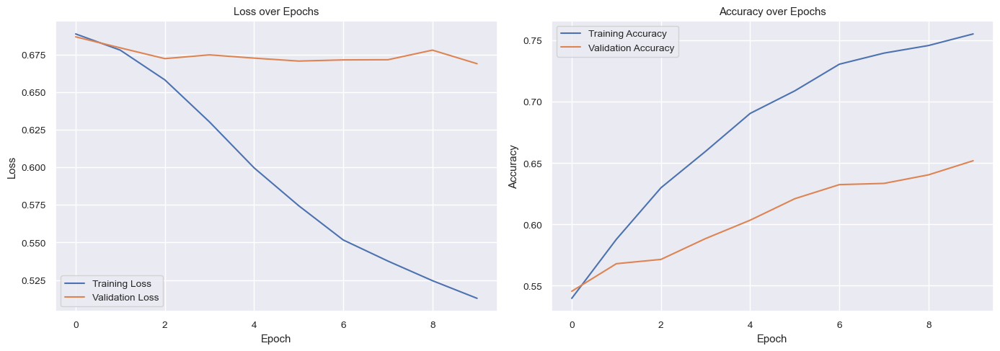


Acurácia balanceada: 0.6519999999999999

Matriz de confusão normalizada:


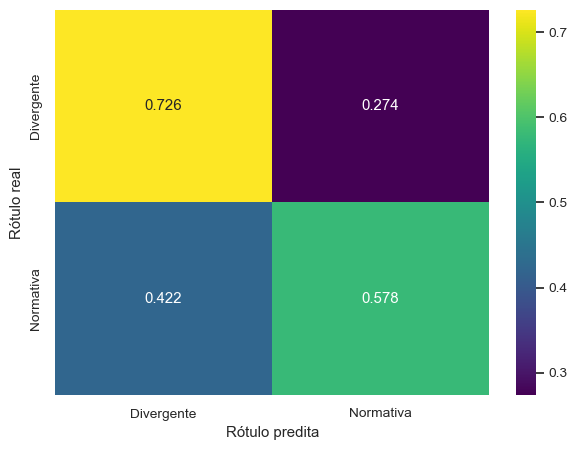

In [27]:
# A celula abaixo carrega o modelo e o histórico (para nao precisar treinar novamente)
# e também imprime todas as métricas de avaliação do modelo
# carregar o modelo e o histórico do BERT Tiny
import pickle
model = tf.keras.models.load_model('model_bert_tiny.keras')
with open('history_bert_tiny.pkl', 'rb') as f:
    history = pickle.load(f)

# Definir uma função para podermos utilizar o history que vem em formato de dict
def plot_loss_accuracy_dict(history_dict):
    # Plot Loss
    plt.figure(figsize=(14, 5))

    plt.subplot(1, 2, 1)
    plt.plot(history_dict['loss'], label='Training Loss')
    if 'val_loss' in history_dict:
        plt.plot(history_dict['val_loss'], label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Loss over Epochs')
    plt.legend()

    # Plot Accuracy
    plt.subplot(1, 2, 2)
    if 'accuracy' in history_dict:
        plt.plot(history_dict['accuracy'], label='Training Accuracy')
    if 'val_accuracy' in history_dict:
        plt.plot(history_dict['val_accuracy'], label='Validation Accuracy')

    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.title('Accuracy over Epochs')
    plt.legend()

    plt.tight_layout()
    plt.show()

print("Modelo BERT - Tiny")
plot_loss_accuracy_dict(history)


# imprimir matriz de confusão relativa
plot_conf_matrix(model, dataset_val, 2)

#### Métricas BERT MEDIUM (max_length = 32)

c:\Users\czset\anaconda3\Lib\site-packages\transformers\generation\tf_utils.py:465: UserWarning: `seed_generator` is deprecated and will be removed in a future version.
  warnings.warn("`seed_generator` is deprecated and will be removed in a future version.", UserWarning)


Modelo BERT - Medium - Max32


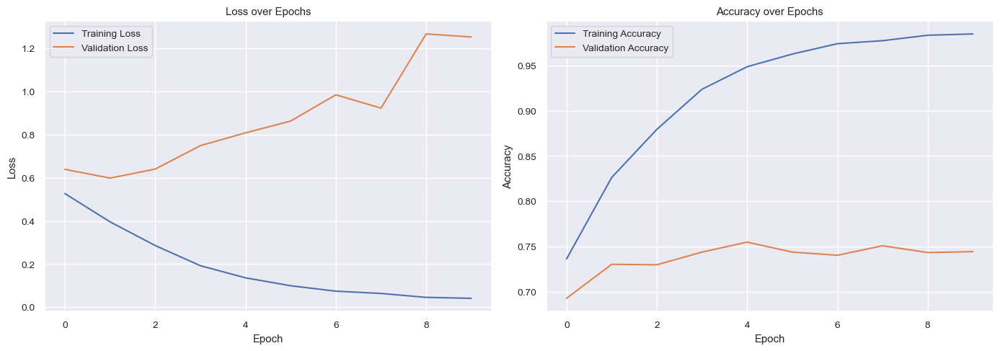


Acurácia balanceada: 0.7444999999999999

Matriz de confusão normalizada:


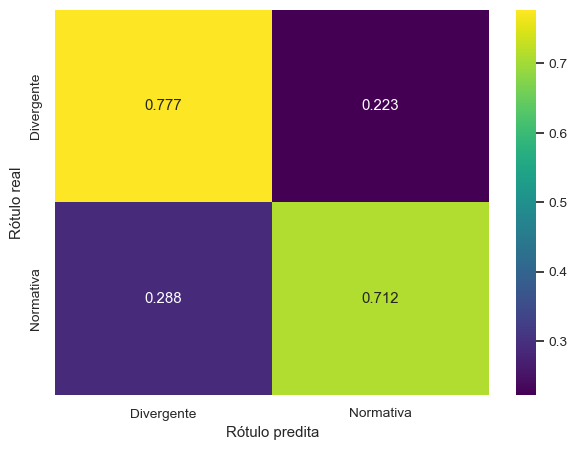

In [31]:
# A celula abaixo carrega o modelo e o histórico (para nao precisar treinar novamente)
# e também imprime todas as métricas de avaliação do modelo
# carregar o modelo e o histórico do BERT MEDIUM com max_length 32
model = tf.keras.models.load_model('model_bert_medium.keras')
with open('history_bert_medium.pkl', 'rb') as f:
    history = pickle.load(f)
print("Modelo BERT - Medium - Max32")
plot_loss_accuracy_dict(history)

# imprimir matriz de confusão relativa
plot_conf_matrix(model, dataset_val, 2)

#### Métricas BERT MEDIUM (max_length = 64)

c:\Users\czset\anaconda3\Lib\site-packages\transformers\generation\tf_utils.py:465: UserWarning: `seed_generator` is deprecated and will be removed in a future version.
  warnings.warn("`seed_generator` is deprecated and will be removed in a future version.", UserWarning)


Modelo BERT - Medium - Max64


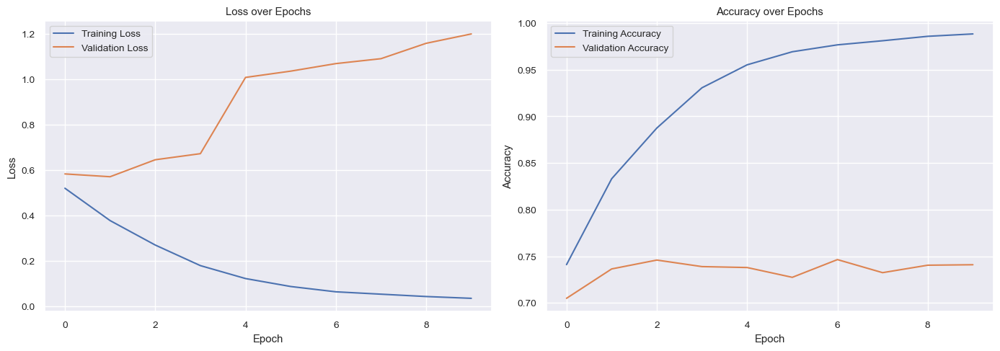


Acurácia balanceada: 0.741

Matriz de confusão normalizada:


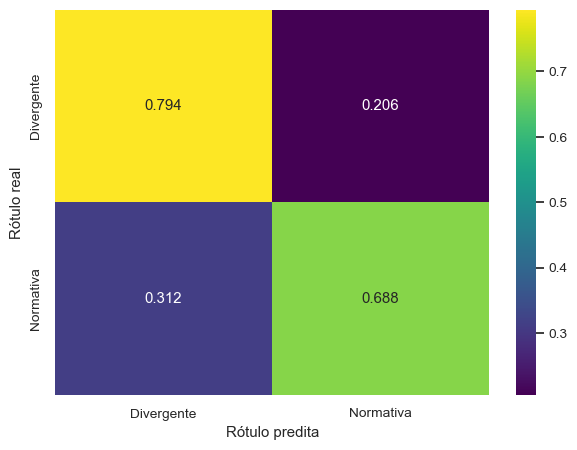

In [35]:
model = tf.keras.models.load_model('model_bert_medium_max64.keras')
with open('history_bert_medium_max64.pkl', 'rb') as f:
    history = pickle.load(f)
print("Modelo BERT - Medium - Max64")
plot_loss_accuracy_dict(history)
plot_conf_matrix(model, dataset_val,2)


### 3 - Ajuste Fino (Fine-Tuning) de Modelos

3. (4.0) Efetue o ajuste fino (fine tuning) em **dois** modelos da lista apresentada no exemplo e compare-os. Teste um dos modelos mais leves (`tiny`, `mini`, ou `small`), e um dos mais pesados (`base` ou `medium`).</br>
Para cada um dos modelos, experimente duas taxas de aprendizado: 0.01 e 0.00001 (embora outras taxas também possam ser exploradas). </br>
Quais as acurácias balanceadas alcançadas no conjunto de validação para cada uma dessas taxas e em cada modelo? </br>
Analise e debata as variações de desempenho observadas entre os modelos e as taxas.

#### Fine Tuning - Bert Tiny

In [ ]:
# Definir duas taxas de aprendizados:
learning_rate_1 = 1e-2


# Vamos alterar epochs para o Bert-Tiny, já que foi observado que o modelo tinha potencial de aumento de acurácia com mais épocas
epochs_tiny = 20

# from transformers import AutoTokenizer, TFAutoModelForSequenceClassification

NUM_LABELS = 2  # Número de classes
model_name = "prajjwal1/bert-tiny" # Escolha do modelo
tokenizer = AutoTokenizer.from_pretrained(model_name)  # Carregar o tokenizer
model = TFAutoModelForSequenceClassification.from_pretrained(model_name, num_labels=NUM_LABELS, from_pt=True, output_attentions=True)  # Carregar o modelo de classificação

optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate_1)
model.compile(optimizer=optimizer, 
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), 
              metrics=["accuracy"])


# Treinar o modelo
history = model.fit(
    dataset_train,  
    validation_data=dataset_val,  
    epochs=epochs_tiny, 
    batch_size=BATCH_SIZE
)

# salvar o history e o modelo
import pickle
model.save('model_bert_tiny_ft_lr1.keras')
with open('history_bert_tiny_ft_lr1.pkl', 'wb') as f:
    pickle.dump(history.history, f)

c:\Users\czset\anaconda3\Lib\site-packages\transformers\generation\tf_utils.py:465: UserWarning: `seed_generator` is deprecated and will be removed in a future version.
  warnings.warn("`seed_generator` is deprecated and will be removed in a future version.", UserWarning)


Modelo BERT - Tiny - Fine-tuned com learning rate 1e-2


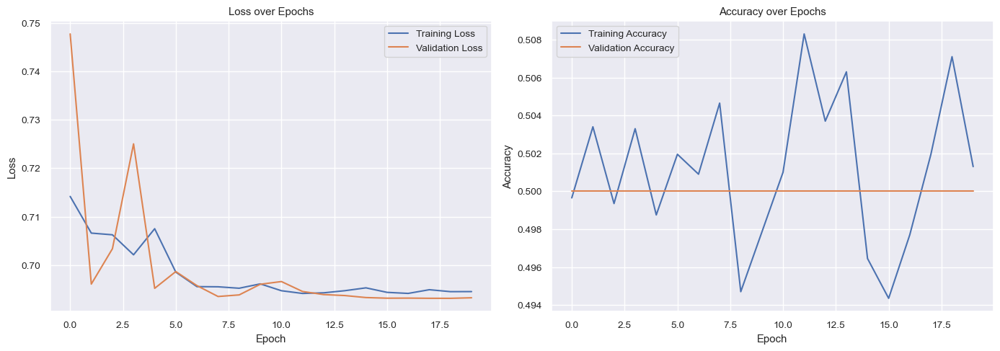


Acurácia balanceada: 0.5

Matriz de confusão normalizada:


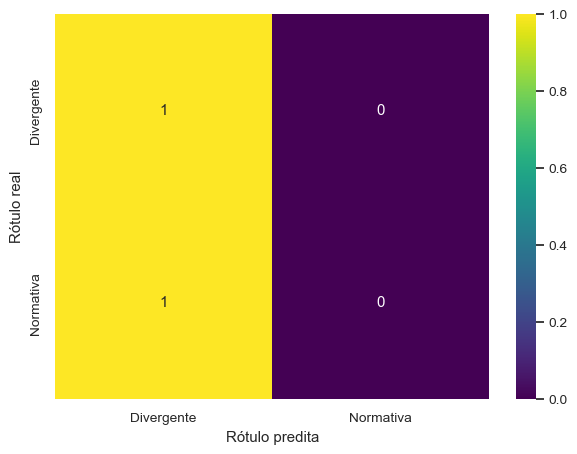

In [39]:
model = tf.keras.models.load_model('model_bert_tiny_ft_lr1.keras')
with open('history_bert_tiny_ft_lr1.pkl', 'rb') as f:
    history = pickle.load(f)

# calcular métricas
print("Modelo BERT - Tiny - Fine-tuned com learning rate 1e-2")
plot_loss_accuracy_dict(history)
plot_conf_matrix(model, dataset_val, 2)

In [ ]:
# agora vamos testar lr 1e-5
# from transformers import AutoTokenizer, TFAutoModelForSequenceClassification
learning_rate_2 = 1e-5
NUM_LABELS = 2  # Número de classes
model_name = "prajjwal1/bert-tiny" # Escolha do modelo
tokenizer = AutoTokenizer.from_pretrained(model_name)  # Carregar o tokenizer
model = TFAutoModelForSequenceClassification.from_pretrained(model_name, num_labels=NUM_LABELS, from_pt=True, output_attentions=True)  # Carregar o modelo de classificação

optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate_2)
model.compile(optimizer=optimizer, 
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), 
              metrics=["accuracy"])


# Treinar o modelo
history = model.fit(
    dataset_train,  
    validation_data=dataset_val,  
    epochs=epochs_tiny, 
    batch_size=BATCH_SIZE
)

# salvar o history e o modelo
import pickle
model.save('model_bert_tiny_ft_lr2.keras')
with open('history_bert_tiny_ft_lr2.pkl', 'wb') as f:
    pickle.dump(history.history, f)

c:\Users\czset\anaconda3\Lib\site-packages\transformers\generation\tf_utils.py:465: UserWarning: `seed_generator` is deprecated and will be removed in a future version.
  warnings.warn("`seed_generator` is deprecated and will be removed in a future version.", UserWarning)


Modelo BERT - Tiny - Fine-tuned com learning rate 1e-5


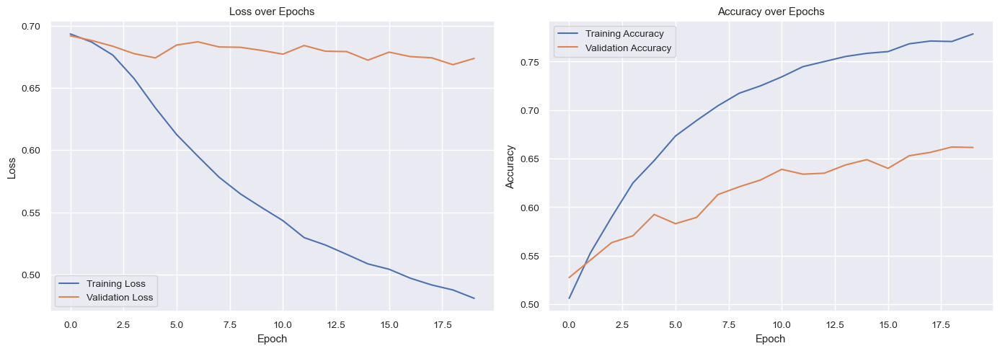


Acurácia balanceada: 0.6615

Matriz de confusão normalizada:


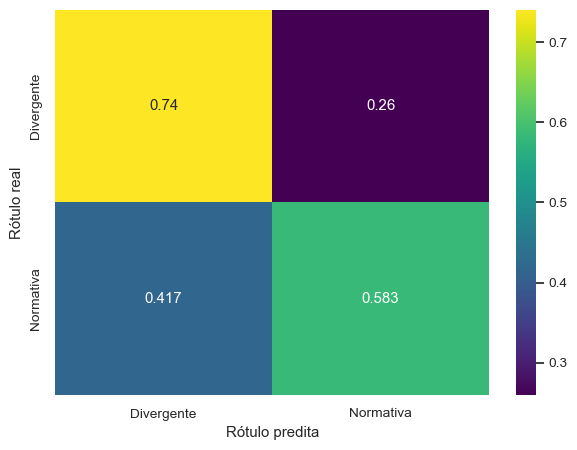

In [40]:
# carregar o modelo e o histórico
model = tf.keras.models.load_model('model_bert_tiny_ft_lr2.keras')
with open('history_bert_tiny_ft_lr2.pkl', 'rb') as f:
    history = pickle.load(f)

# calcular métricas
print("Modelo BERT - Tiny - Fine-tuned com learning rate 1e-5")
plot_loss_accuracy_dict(history)
plot_conf_matrix(model, dataset_val, 2)

#### Fine Tuning - Bert Medium (com max_length = 64)

In [ ]:
learning_rate_1 = 1e-2
NUM_LABELS = 2  # Número de classes
model_name = "prajjwal1/bert-medium"  # Escolha o modelo conforme sua necessidade
tokenizer = AutoTokenizer.from_pretrained(model_name)  # Carregar o tokenizer
model = TFAutoModelForSequenceClassification.from_pretrained(model_name, num_labels=NUM_LABELS, from_pt=True, output_attentions=True)  # Carregar o modelo de classificação

optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate_1)
model.compile(optimizer=optimizer, 
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), 
              metrics=["accuracy"])

# # Será necessário preprocessar novamente os dados ao alteramos o max_length

# tokenized_train = dataset['train'].map(
#     lambda examples: preprocess_function(examples, max_length=max_length),
#     batched=True,
#     remove_columns=['situation', 'intention', 'moral_consequence', 'immoral_consequence', 'ID']  # Remove colunas não utilizadas
# )
# tokenized_validation = dataset['validation'].map(
#     lambda examples: preprocess_function(examples, max_length=max_length),
#     batched=True,
#     remove_columns=['situation', 'intention', 'moral_consequence', 'immoral_consequence', 'ID']  # Remove colunas não utilizadas
# )
# tokenized_test = dataset['test'].map(
#     lambda examples: preprocess_function(examples, max_length=max_length),
#     batched=True,
#     remove_columns=['situation', 'intention', 'moral_consequence', 'immoral_consequence', 'ID']  # Remove colunas não utilizadas
# )
# dataset_train = convert_to_tf_dataset(tokenized_train)
# dataset_val = convert_to_tf_dataset(tokenized_validation)
# dataset_test = convert_to_tf_dataset(tokenized_test)
# print("Datasets criados com sucesso!")

# Treinar o modelo
history = model.fit(
    dataset_train,  
    validation_data=dataset_val,  
    epochs=10, 
    batch_size=BATCH_SIZE
    )

# salvar o history e o modelo
import pickle
model.save('model_bert_medium_ft_lr1.keras')
with open('history_bert_medium_ft_lr1.pkl', 'wb') as f:
    pickle.dump(history.history, f)

Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFBertForSequenceClassification: ['bert.embeddings.position_ids']
- This IS expected if you are initializing TFBertForSequenceClassification from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFBertForSequenceClassification from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
Some weights or buffers of the TF 2.0 model TFBertForSequenceClassification were not initialized from the PyTorch model and are newly initialized: ['classifier.weight', 'classifier.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/10


79/79 [==============================] - 3287s 40s/step - loss: 0.9416 - accuracy: 0.4934 - val_loss: 0.6994 - val_accuracy: 0.5000
Epoch 2/10
79/79 [==============================] - 2429s 30s/step - loss: 0.7362 - accuracy: 0.5020 - val_loss: 1.0133 - val_accuracy: 0.5000
Epoch 3/10
79/79 [==============================] - 2356s 29s/step - loss: 0.7744 - accuracy: 0.4984 - val_loss: 0.6938 - val_accuracy: 0.5000
Epoch 4/10
79/79 [==============================] - 2563s 32s/step - loss: 0.7221 - accuracy: 0.5007 - val_loss: 0.6932 - val_accuracy: 0.5000
Epoch 5/10
79/79 [==============================] - 3025s 37s/step - loss: 0.7256 - accuracy: 0.5008 - val_loss: 0.7072 - val_accuracy: 0.5000
Epoch 6/10
79/79 [==============================] - 2521s 31s/step - loss: 0.7444 - accuracy: 0.4985 - val_loss: 0.6953 - val_accuracy: 0.5000
Epoch 7/10
79/79 [==============================] - 2384s 29s/step - loss: 0.7293 - accuracy: 0.4974 - val_loss: 0.7096 - val_accuracy: 0.50

c:\Users\czset\anaconda3\Lib\site-packages\transformers\generation\tf_utils.py:465: UserWarning: `seed_generator` is deprecated and will be removed in a future version.
  warnings.warn("`seed_generator` is deprecated and will be removed in a future version.", UserWarning)


Modelo BERT - Medium - Fine-tuned com learning rate 1e-2


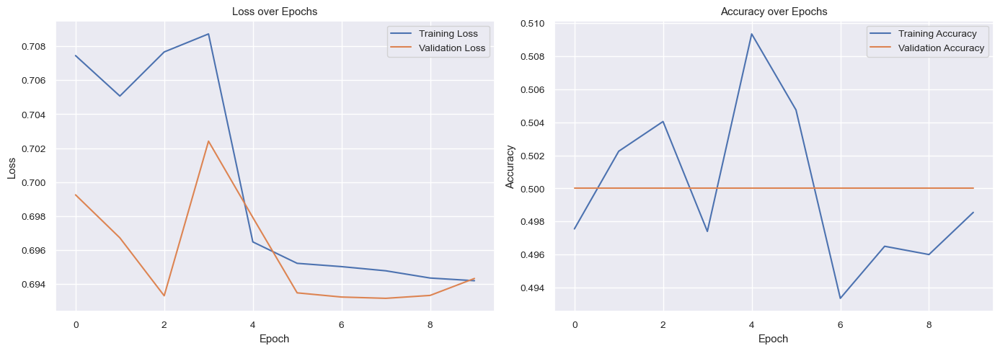


Acurácia balanceada: 0.5

Matriz de confusão normalizada:


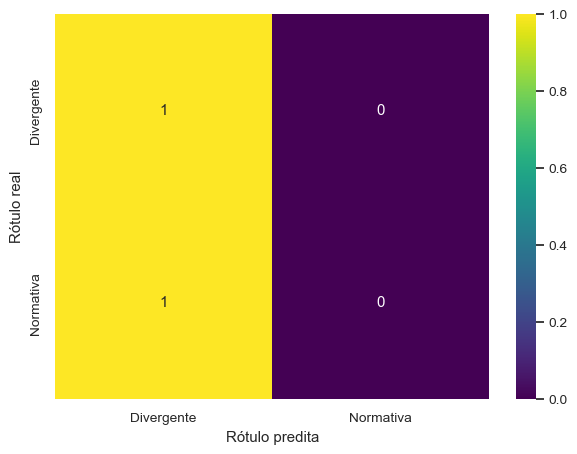

In [44]:
# Carregar o modelo e o histórico
model = tf.keras.models.load_model('model_bert_medium_ft_lr1.keras')
with open('history_bert_medium_ft_lr1.pkl', 'rb') as f:
    history = pickle.load(f)

# calcular métricas
print("Modelo BERT - Medium - Fine-tuned com learning rate 1e-2")
plot_loss_accuracy_dict(history)
plot_conf_matrix(model, dataset_val,2)

In [13]:
# repetir para learning_rate_2
learning_rate_2 = 1e-5
model_name = "prajjwal1/bert-medium"  
tokenizer = AutoTokenizer.from_pretrained(model_name) 
model = TFAutoModelForSequenceClassification.from_pretrained(model_name, num_labels=NUM_LABELS, from_pt=True, output_attentions=True)  # Carregar o modelo de classificação

optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate_2)
max_length = 64  # ou 32
model.compile(optimizer=optimizer, 
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), 
              metrics=["accuracy"])

# # Será necessário preprocessar novamente os dados porque alteramos o max_length
# tokenized_train = dataset['train'].map(
#     lambda examples: preprocess_function(examples, max_length=max_length),
#     batched=True,
#     remove_columns=['situation', 'intention', 'moral_consequence', 'immoral_consequence', 'ID']  # Remove colunas não utilizadas
# )
# tokenized_validation = dataset['validation'].map(
#     lambda examples: preprocess_function(examples, max_length=max_length),
#     batched=True,
#     remove_columns=['situation', 'intention', 'moral_consequence', 'immoral_consequence', 'ID']  # Remove colunas não utilizadas
# )
# tokenized_test = dataset['test'].map(
#     lambda examples: preprocess_function(examples, max_length=max_length),
#     batched=True,
#     remove_columns=['situation', 'intention', 'moral_consequence', 'immoral_consequence', 'ID']  # Remove colunas não utilizadas
# )
# dataset_train = convert_to_tf_dataset(tokenized_train)
# dataset_val = convert_to_tf_dataset(tokenized_validation)
# dataset_test = convert_to_tf_dataset(tokenized_test)
# print("Datasets criados com sucesso!")


# Treinar o modelo
history = model.fit(
    dataset_train,  
    validation_data=dataset_val,  
    epochs=10, 
    batch_size=BATCH_SIZE
    )

# salvar o history e o modelo
import pickle
model.save('model_bert_medium_ft_lr2.keras')
with open('history_bert_medium_ft_lr2.pkl', 'wb') as f:
    pickle.dump(history.history, f)

Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFBertForSequenceClassification: ['bert.embeddings.position_ids']
- This IS expected if you are initializing TFBertForSequenceClassification from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFBertForSequenceClassification from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
Some weights or buffers of the TF 2.0 model TFBertForSequenceClassification were not initialized from the PyTorch model and are newly initialized: ['classifier.weight', 'classifier.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/10


79/79 [==============================] - 2397s 28s/step - loss: 0.6202 - accuracy: 0.6568 - val_loss: 0.6414 - val_accuracy: 0.6585
Epoch 2/10
79/79 [==============================] - 2126s 26s/step - loss: 0.5059 - accuracy: 0.7595 - val_loss: 0.6073 - val_accuracy: 0.6930
Epoch 3/10
79/79 [==============================] - 2025s 25s/step - loss: 0.4596 - accuracy: 0.7886 - val_loss: 0.5948 - val_accuracy: 0.7090
Epoch 4/10
79/79 [==============================] - 2141s 27s/step - loss: 0.4302 - accuracy: 0.8084 - val_loss: 0.5933 - val_accuracy: 0.7205
Epoch 5/10
79/79 [==============================] - 2068s 26s/step - loss: 0.4025 - accuracy: 0.8238 - val_loss: 0.5770 - val_accuracy: 0.7265
Epoch 6/10
79/79 [==============================] - 2056s 26s/step - loss: 0.3795 - accuracy: 0.8346 - val_loss: 0.5920 - val_accuracy: 0.7350
Epoch 7/10
79/79 [==============================] - 2057s 26s/step - loss: 0.3530 - accuracy: 0.8520 - val_loss: 0.6129 - val_accuracy: 0.73

c:\Users\czset\anaconda3\Lib\site-packages\transformers\generation\tf_utils.py:465: UserWarning: `seed_generator` is deprecated and will be removed in a future version.
  warnings.warn("`seed_generator` is deprecated and will be removed in a future version.", UserWarning)


c:\Users\czset\anaconda3\Lib\site-packages\transformers\generation\tf_utils.py:465: UserWarning: `seed_generator` is deprecated and will be removed in a future version.
  warnings.warn("`seed_generator` is deprecated and will be removed in a future version.", UserWarning)


Modelo BERT - Medium - Fine-tuned com learning rate 1e-5


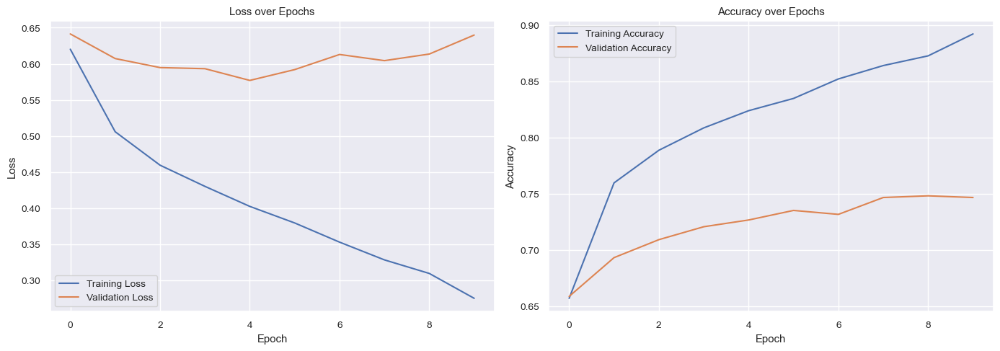


Acurácia balanceada: 0.7464999999999999

Matriz de confusão normalizada:


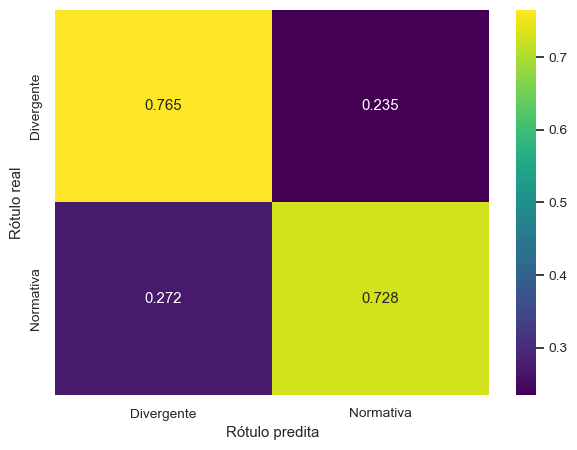

In [45]:
# Carregar o modelo e o histórico
model = tf.keras.models.load_model('model_bert_medium_ft_lr2.keras')
with open('history_bert_medium_ft_lr2.pkl', 'rb') as f:
    history = pickle.load(f)


# calcular métricas
print("Modelo BERT - Medium - Fine-tuned com learning rate 1e-5")
plot_loss_accuracy_dict(history)
plot_conf_matrix(model, dataset_val,2)

Discussão:

Nestre trabalho, definiu-se dois modelos baseline: BERT Tiny e BERT Medium, avaliando dois casos extremos (o mais leve e o mais pesado, respectivamente).

Abaixo, segue um resumo dos prós e contras observados durante as fases de treinamento e de fine-tuning.

Prós do BERT TINY:
- Menor custo computacional. O tempo de treinamento dos modelos BERT Tiny não ultrapassou uma hora.
- Bom modelo baseline para avaliações iniciais.
- O modelo foi treinado sem problemas para um max_length (na função de preprocessamento do dataset) = 128, o que, supostamente, evitou que o modelo memorizasse o conjunto de treinamento.

Contras do BERT Tiny:
- Acurácia final balanceada igual a 0.6615 (modelo fine tuned com Learning Rate = 1e-5)
- A predição da classe normativa prejudicou a acurácia final, como se pode observar na matriz de confusão.
- A redução do learning rate de 2e-5 para 1e-5 não trouxe ganhos significativos.

Prós do BERT Medium:
- Acurácia final baalanceada igual a 0.7465  (modelo fine tuned com Learning Rate = 1e-5).
- Na matriz de confusão, observa-se grande melhoria na predição da classe normativa, quando comparada à predição da mesma classe pelo modelo Bert Tiny.

Contras do Bert Medium:
- Computacionalmente caro. O treinamento do modelo BERT Medium com learning rate = 1e-5 demorou 6 horas para ser concluído (CPU: Intel Core i7-8550U)
- A redução do learning rate de 1e-4 para 1e-5 não trouxe ganhos significativos.
- Não foi possível treinar o modelo com um max_length = 128. Foi necessário reduzir para 64. Também testou-se max_length = 32, não apresentando diferenças substanciais. Mesmo assim, optou-se seguir com max_length = 64 para o fine tuning.
- Nas curvas de acurácia vs épocas, observou-se overfitting. Possivelmente, o max_length = 128 pode ter ocasionado uma memorização do conjunto de treinamento.

Observações gerais:
- Durante o treinamento do BERT Tiny, observou-se que o aumento de epochs poderia trazer ganhos. Iniciou-se com epochs = 10, aumentando para 20 na fase de fine tuning. Observou-se, de fato, que epochs = 20 trouxe maior acurácia nos conjuntos de treino e validação, sem overfitting. É sugerido testar epochs > 20 para avaliar se o modelo generaliza melhor, sempre atentando ao overfitting.

- O uso de learning_rate = 1e-2 trouxe resultados ruins, tanto para BERT Tiny, quanto para BERT Medium. Ambos modelos, com essa taxa de aprendizado, predizeram todas as amostras como classe Divergente, trazendo uma acurácia final de 0.5000.





### 4 - Avaliação do Modelo com Melhor Desempenho no Conjunto de Teste
4. (2.0) Utilize o modelo com melhor desempenho no conjunto teste e analise os resultados. Discuta brevemente os principais desafios enfrentados durante o treinamento do modelo e as soluções adotadas para superá-los. Além disso, reveja os hiperparâmetros escolhidos e reflita sobre o impacto potencial deles no desempenho do modelo.

In [46]:
# o melhor desempenho foi obtido com o BERT Medium Fine Tuned. 
# Carregar o modelo:
model = tf.keras.models.load_model('model_bert_medium_ft_lr2.keras')


c:\Users\czset\anaconda3\Lib\site-packages\transformers\generation\tf_utils.py:465: UserWarning: `seed_generator` is deprecated and will be removed in a future version.
  warnings.warn("`seed_generator` is deprecated and will be removed in a future version.", UserWarning)


In [47]:
predictions = model.predict(dataset_test).logits  # Obtendo logits
# Converter logits para rótulos preditos
predicted_labels = np.argmax(predictions, axis=1)

# Extraindo os rótulos reais
true_labels = []
for batch in dataset_test:
    true_labels.extend(batch[1].numpy())

true_labels = np.array(true_labels)  # Convertendo para NumPy array

# Exibir resultados
print(f"Exemplo de predições: {predicted_labels[:10]}")  # Mostra os primeiros 10
print(f"Formato das predições: {predicted_labels.shape}")
print(f"Formato dos rótulos reais: {true_labels.shape}")

8/8 [==============================] - 74s 9s/step
Exemplo de predições: [0 1 1 0 1 0 0 0 0 1]
Formato das predições: (2000,)
Formato dos rótulos reais: (2000,)



Acurácia balanceada: 0.681

Matriz de confusão normalizada:


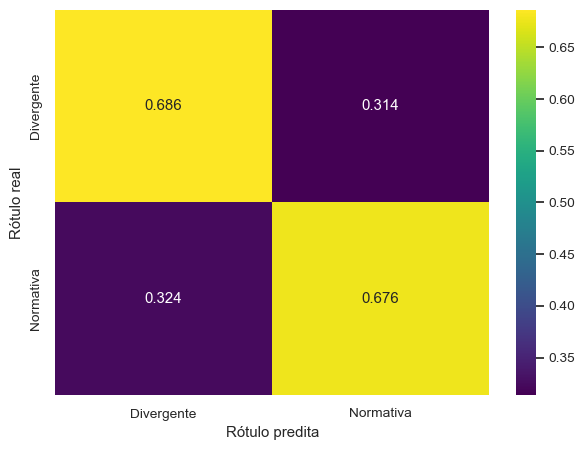

In [48]:
# verificar métricas no conjunto de teste.
plot_conf_matrix(model, dataset_test, 2)

Discussão:

Utilizou-se o modelo BERT Medium com fine-tuning para realizar predições no conjunto de teste, alcançando uma acurácia balanceada de 0.7465 na fase de treinamento. No teste, houve uma queda na acurácia para 0.6810, sugerindo um impacto na capacidade de generalização do modelo para dados nunca vistos.

Os principais desafios enfrentados no treinamento do BERT Medium foram expostos anteriormente, mas destaca-se seu alto custo computacional, mesmo utilizando max_length = 64 no preprocessamento dos dados. Durante o treinamento, não foi possível testar max_length = 128 (igual ao BERT Tiny) devido à limitação de recursos, pois o sistema excedia o uso da CPU. O uso de max_length = 64 pode ter contribuído para overfitting, o que é corroborado pela queda de acurácia observada no conjunto de testes.

A escolha de learning_rate = 1e-5 não demonstrou grandes benefícios para o desempenho do modelo e ainda aumentou o custo computacional. Para aprimorar os experimentos, sugere-se:

1. Testar valores menores de learning_rate (ex.: 5e-6) para verificar estabilidade no aprendizado.

2. Aumentar o max_length (256 ou mais), desde que os recursos computacionais permitam.

3. Explorar técnicas de regularização, como dropout, para mitigar o risco de overfitting, embora isso possa exigir ajustes para evitar penalização da acurácia.

### 5 - Análise do Mecanismo de Atenção com BertViz
5. (2.0) Use a ferramenta BertViz (github.com/jessevig/bertviz) para explorar os pesos do modelo selecionado na atividade anterior. Ao inspecionar o comportamento desse modelo, especificamente o transformador e seu mecanismo de atenção, quais padrões se tornam evidentes? Realize uma análise crítica desses padrões, destacando como eles podem impactar a interpretação e a performance do modelo.


In [10]:
from transformers import AutoTokenizer, AutoModel
model_name = "prajjwal1/bert-medium"
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModel.from_pretrained(model_name)

C:\Users\czset\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\huggingface_hub\file_download.py:143: UserWarning: `huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in C:\Users\czset\.cache\huggingface\hub\models--prajjwal1--bert-medium. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by setting the `HF_HUB_DISABLE_SYMLINKS_WARNING` environment variable. For more details, see https://huggingface.co/docs/huggingface_hub/how-to-cache#limitations.
To support symlinks on Windows, you either need to activate Developer Mode or to run Python as an administrator. In order to activate developer mode, see this article: https://docs.microsoft.com/en-us/windows/apps/get-started/enable-your-device-for-development
  warnings.warn(message)


In [27]:
from transformers import AutoTokenizer, AutoModel
from bertviz import head_view
import torch

# Carrega o modelo da BERT Medium da Hugging Face e o tokenizer.
model_name = 'prajjwal1/bert-medium'
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModel.from_pretrained(model_name, output_attentions=True)

# Escolhe uma amostra do dataset.
sample = dataset['test'][1]

norm = sample['norm']
situation = sample['situation']
intention = sample['intention']
moral_action = sample['moral_action']
moral_consequence = sample['moral_consequence']
immoral_action = sample['immoral_action']
immoral_consequence = sample['immoral_consequence']

# Frase de entrada.
phrase = f"NORM {norm} SITUATION {situation} INTENTION {intention} MORAL_ACTION {moral_action} MORAL_CONSEQUENCE {moral_consequence} IMMORAL_ACTION {immoral_action} IMMORAL_CONSEQUENCE {immoral_consequence}"

# Tokeniza e gera o mecanismo de atenção.
inputs = tokenizer.encode_plus(phrase, return_tensors='pt')

with torch.no_grad():
    outputs = model(**inputs)
    attention = outputs.attentions

tokens = tokenizer.convert_ids_to_tokens(inputs['input_ids'][0])

head_view(attention, tokens)

<IPython.core.display.Javascript object>

Discussão:

Analisando a matriz de atenção, é possível notar que na primeira camada a atenção está voltada para conexões locais, ou seja, os tokens prestam atenção em si mesmos e em palavras próximas. As linhas são mais horizontais e curtas, indicando pouca interação entre partes distantes da frase de entrada.

Entre as camadas 3 a 5 começamos a ver mais linhas cruzando partes diferentes da frase, isto é, a atenção está ligeiramente mais dispersa, com alguns tokens recebendo atenção de partes mais distantes, incluindo transições entre seções como norm, situation, e as action's. Isso indica que o modelo pode estar capturando relações semânticas mais complexas, conectando informações entre diferentes partes da entrada (por exemplo, relacionando seções de ações/consequências à norma/intenção/situação).

Na última camada a atenção volta a ser concentrada, mas agora tokens-chave podem recebem atenção de várias partes da frase.
O padrão observado para a evolução da atenção ao longo das camadas é de atenção local nas primeiras camadas, passando para atenção mais interligada nas intermediárias, e caráter definidor nas finais.

Foi observado que nas últimas camadas há foco em tokens irrelevantes, o que indica dificuldade do modelo em capturar conexões semânticas. Isto prejudica a performance e dificulta a explicação das decisões.

Em suma, as observações do BertViz foram:

Camadas iniciais (Layer 0-2): A atenção é mais difusa, sem concentração forte em tokens específicos. [CLS] e [SEP] começam a receber mais atenção na Layer 1, principalmente nas cabeças 1 e 2.

Camadas intermediárias (Layer 3-4): Começam a surgir relações mais fortes entre pares de tokens, especialmente entre palavras-chave relacionadas à moralidade. [CLS] recebe atenção de frases completas, sugerindo que o modelo está organizando informações para possível classificação.

Camadas finais (Layer 5-7): Atenção concentrada quase exclusivamente em [SEP], indicando que o modelo pode estar usando esse token para estruturar o processamento da frase antes da tomada de decisão. Apesar disso, relações diretas entre pares de tokens ainda aparecem, mas em menor intensidade.

Esse padrão sugere que, ao longo das layers, o modelo passa de uma atenção difusa e dispersa para uma estrutura mais focada e segmentada, com tendência a depender fortemente de [SEP] nas camadas mais profundas. Isso pode indicar que o modelo ainda precisa de ajustes para reduzir essa dependência e melhorar sua capacidade de capturar relações semânticas diretamente entre palavras-chave.

O fato de max_length utilizado ter sido igual a 64 pode ter ocasionado o modelo dar muita atenção ao token [SEP] para que buscasse mais contexto no bloco de palavras seguintes, o que pode ter gerado um impacto negativo na classificação correta dos rótulos na fase de testes do modelo.